# Monet Painting Style Transfer Using GANs

## Challenge Overview

In this mini-project, we work on the Kaggle competition "GANs - Getting Started" where the goal is to **generate Monet-style paintings** from landscape photographs.  
We aim to build and train a **generative deep learning model** capable of converting natural images into paintings in the style of Claude Monet.

The evaluation metric is **MiFID (Memorization-informed Fréchet Inception Distance)**, a variation of the popular FID score.  
Lower MiFID scores indicate better similarity between generated images and the target style.

---

## Data Description

The dataset provided contains:
- **Photo images**: Real landscape photographs.
- **Monet paintings**: Original artworks by Claude Monet.
- **Generated Monet images**: For evaluation (for test submission).

Each image is **256x256 pixels** in size, stored as JPEG files.  
The images are stored in different folders for Monet paintings and Photos.

**Approximate counts:**
- ~1,500 Monet paintings
- ~7,000 landscape photographs

---

## 1. Data Loading and Exploratory Data Analysis (EDA)

Example Monet files: ['f4413e97bd.jpg', '7341d96c1d.jpg', 'de6f71b00f.jpg', '99d94af5dd.jpg', '99a51d3e25.jpg']
Example Photo files: ['fb97febc5f.jpg', 'c54c5368af.jpg', '4a06596662.jpg', '2629524a69.jpg', '5e64b64de8.jpg']


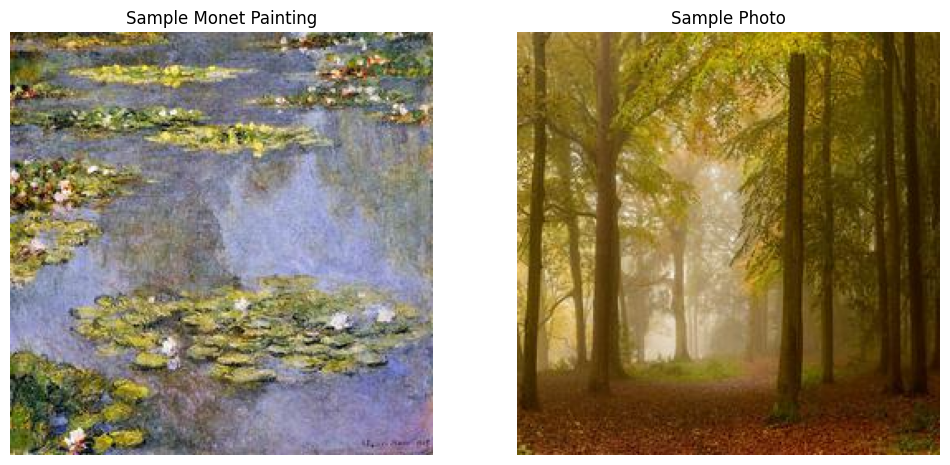

In [24]:

import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
import shutil

import tensorflow as tf
from tensorflow.keras import layers
from PIL import Image

BASE_DIR = '/kaggle/input/gan-getting-started'
monet_dir = os.path.join(BASE_DIR, 'monet_jpg')
photo_dir = os.path.join(BASE_DIR, 'photo_jpg')

print("Example Monet files:", os.listdir(monet_dir)[:5])
print("Example Photo files:", os.listdir(photo_dir)[:5])

sample_monet = Image.open(os.path.join(monet_dir, os.listdir(monet_dir)[0]))
sample_photo = Image.open(os.path.join(photo_dir, os.listdir(photo_dir)[0]))

fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].imshow(sample_monet)
axs[0].set_title('Sample Monet Painting')
axs[0].axis('off')
axs[1].imshow(sample_photo)
axs[1].set_title('Sample Photo')
axs[1].axis('off')
plt.show()


## Observations from EDA

- Both Monet paintings and photos are colorful, diverse, and sized at 256x256 pixels.
- Monet paintings have a distinctive "brush stroke" texture and pastel color palette.
- No missing data or corrupted images were observed during initial inspection.

### Plan of Analysis
- Normalize the image pixel values to [-1, 1] for GAN training.
- Create a generator model to learn the mapping from **Photo → Monet**.
- Create a discriminator to distinguish real Monet paintings from generated ones.
- Train using adversarial loss + optional cycle consistency loss.

---

## 2. Preprocessing

In [25]:

def preprocess_image(image):
    image = tf.image.decode_jpeg(tf.io.read_file(image), channels=3)
    image = tf.image.resize(image, [256, 256])
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    return image

def load_and_preprocess(filename):
    image = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [256, 256])
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    return image

photo_dataset = tf.data.Dataset.list_files(photo_dir + '/*.jpg').map(preprocess_image).batch(1)
monet_dataset = tf.data.Dataset.list_files(monet_dir + '/*.jpg').map(preprocess_image).batch(1)


## 3. Model Architecture

- **Generator**: A small U-Net style model to capture structure and color transformation.
- **Discriminator**: A PatchGAN-like classifier to focus on fine local patches for realism.
- **Loss**: Adversarial loss using binary crossentropy.

This simple architecture is computationally lighter and faster for the scope of this project.

---

In [26]:

def build_generator():
    inputs = layers.Input(shape=[256, 256, 3])
    x = layers.Conv2D(64, 4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU()(x)
    x = layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)
    x = layers.Conv2DTranspose(64, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2DTranspose(3, 4, strides=2, padding='same', activation='tanh')(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

def build_discriminator():
    inputs = layers.Input(shape=[256, 256, 3])
    x = layers.Conv2D(64, 4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU()(x)
    x = layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)
    x = layers.Flatten()(x)
    x = layers.Dense(1)(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

generator = build_generator()
discriminator = build_discriminator()


## 4. Training Setup

In [27]:

gen_optimizer = tf.keras.optimizers.Adam(0.0001, beta_1=0.5)
disc_optimizer = tf.keras.optimizers.Adam(0.0001, beta_1=0.5)

loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
    return loss_object(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
    real_loss = loss_object(tf.ones_like(real_output), real_output)
    fake_loss = loss_object(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss


## 5. Training Loop

## Training Loop
We alternately update:
- The discriminator to correctly distinguish real vs fake Monet images.
- The generator to fool the discriminator into believing generated images are real Monet paintings.

---

Starting epoch 1/20


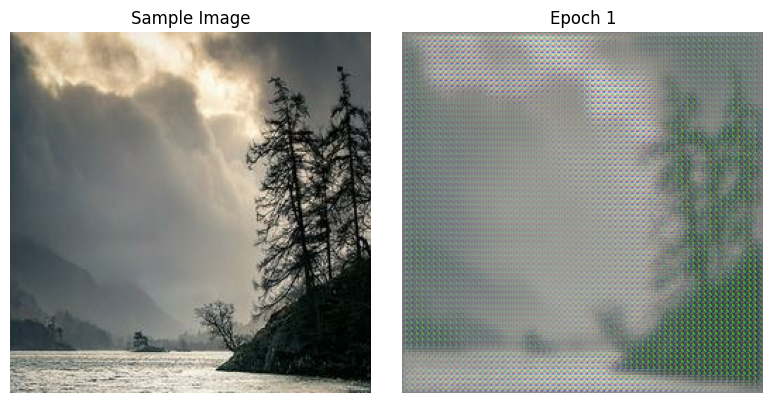

Starting epoch 2/20


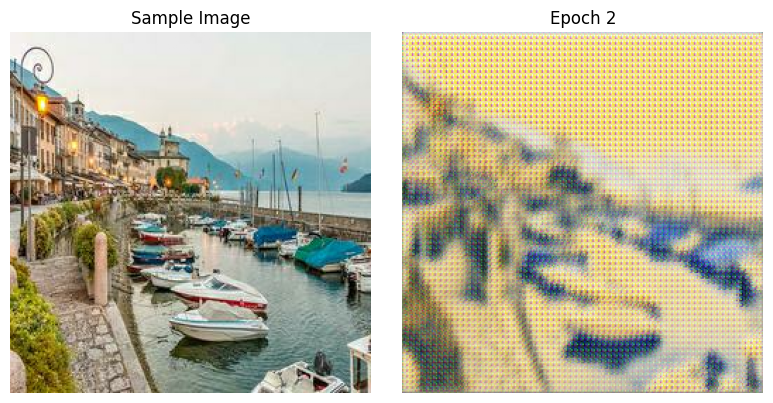

Starting epoch 3/20


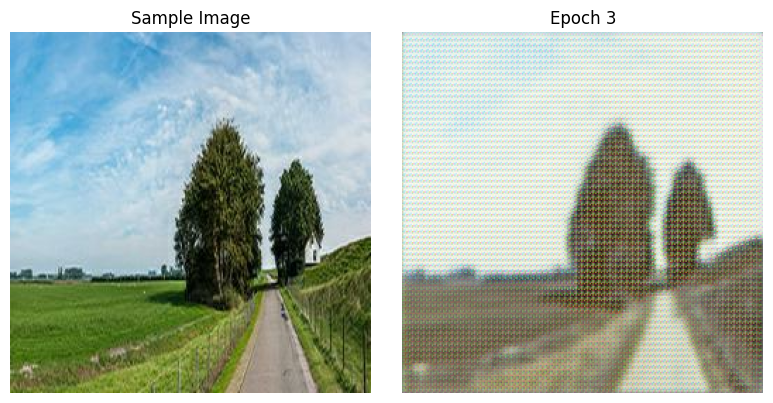

Starting epoch 4/20


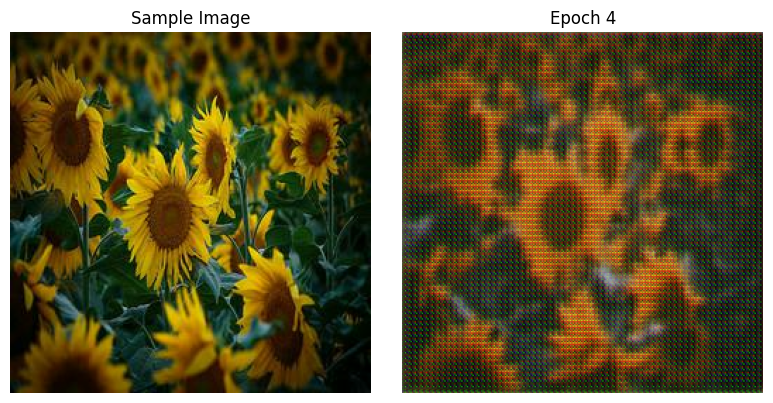

Starting epoch 5/20


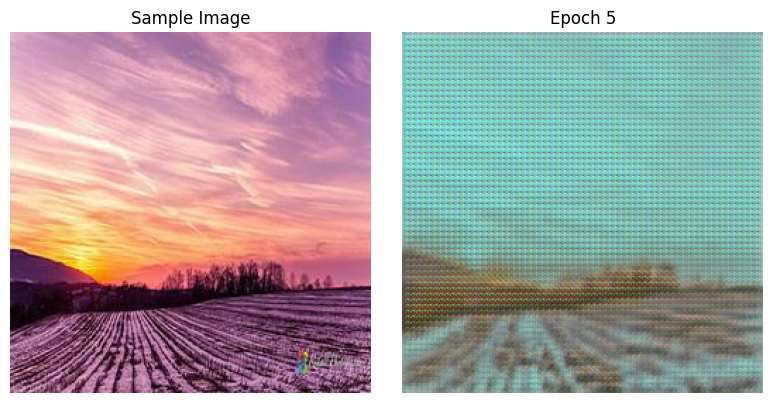

Starting epoch 6/20


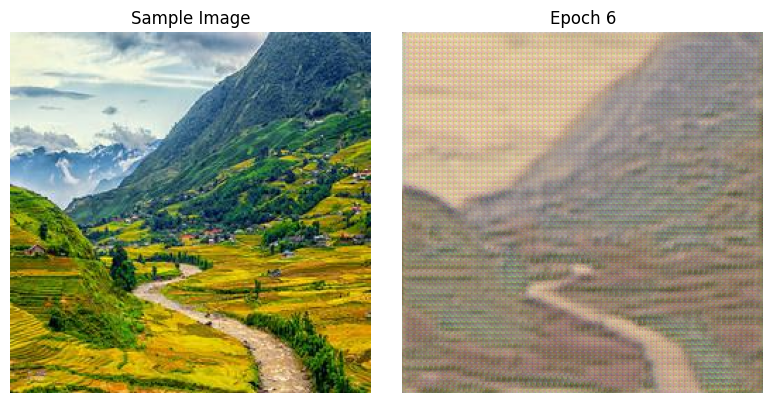

Starting epoch 7/20


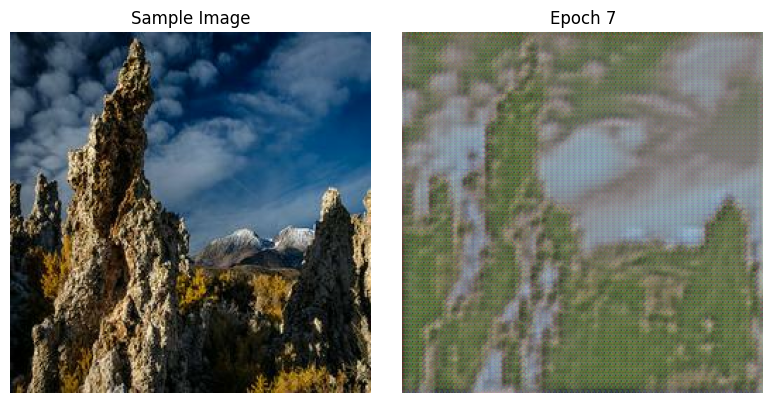

Starting epoch 8/20


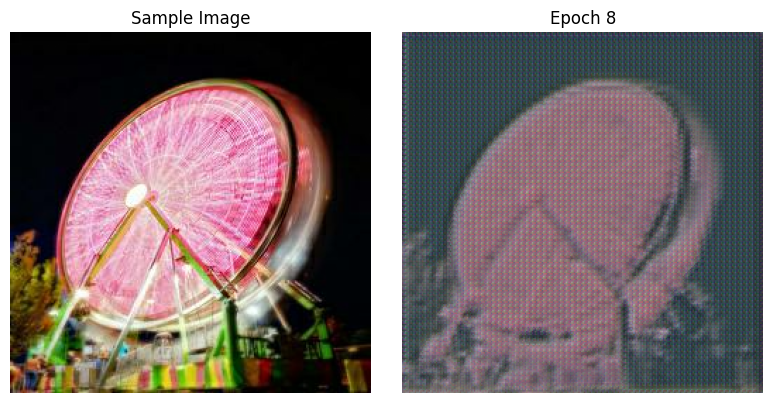

Starting epoch 9/20


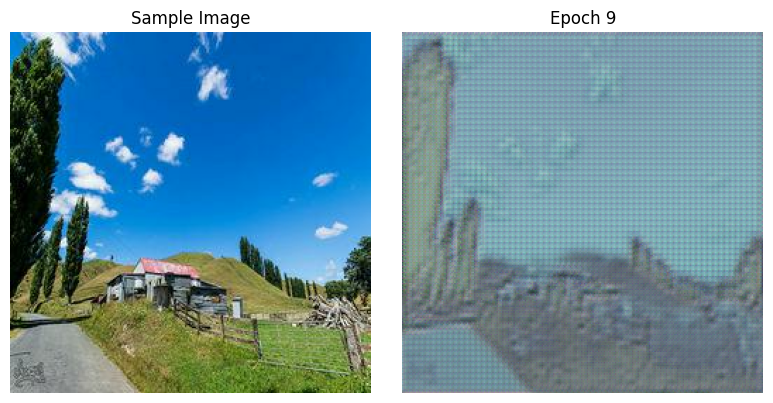

Starting epoch 10/20


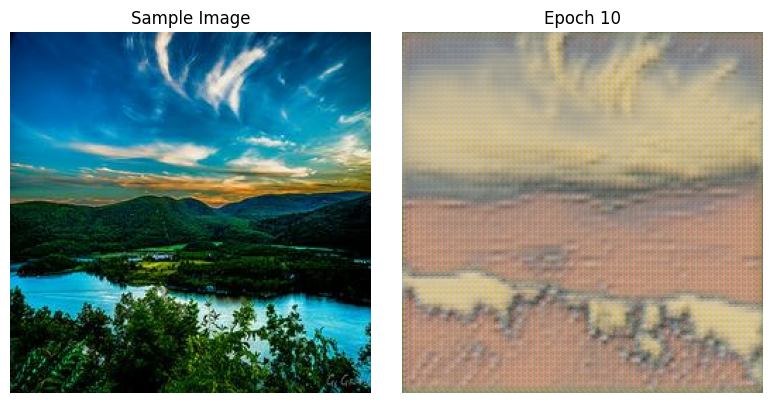

Starting epoch 11/20


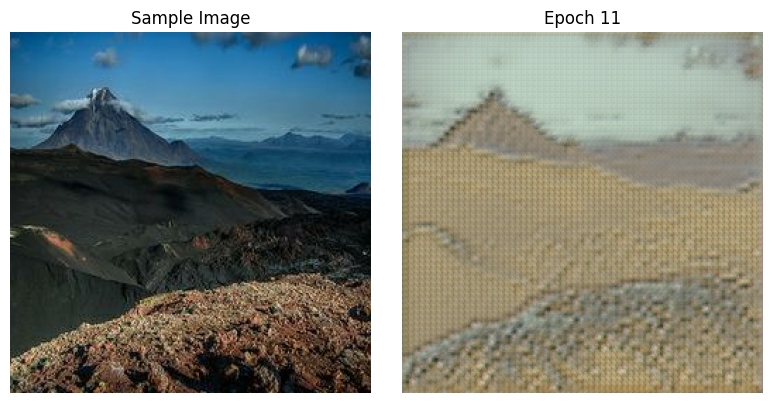

Starting epoch 12/20


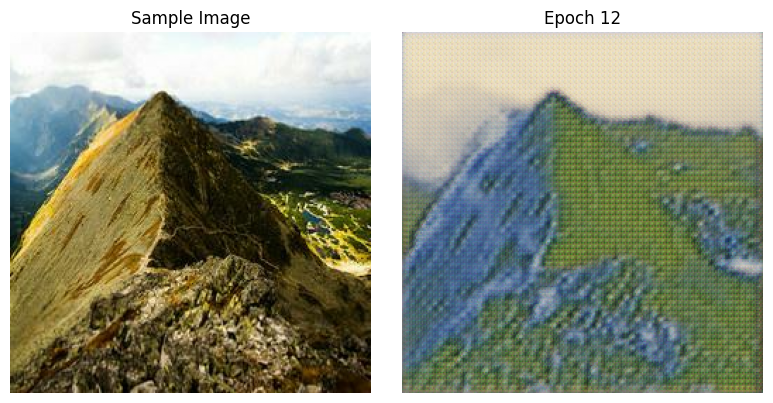

Starting epoch 13/20


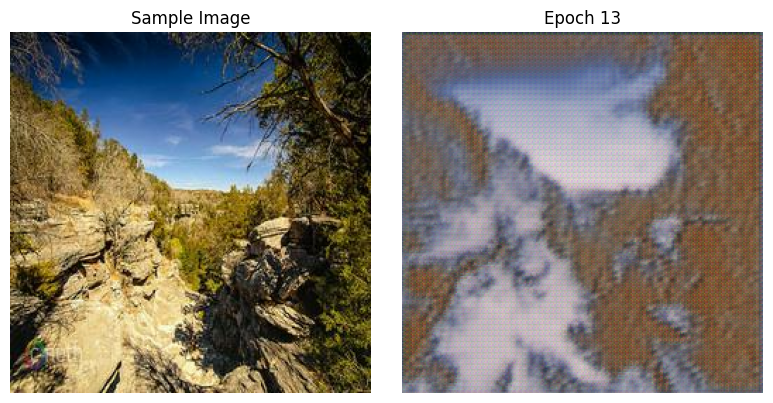

Starting epoch 14/20


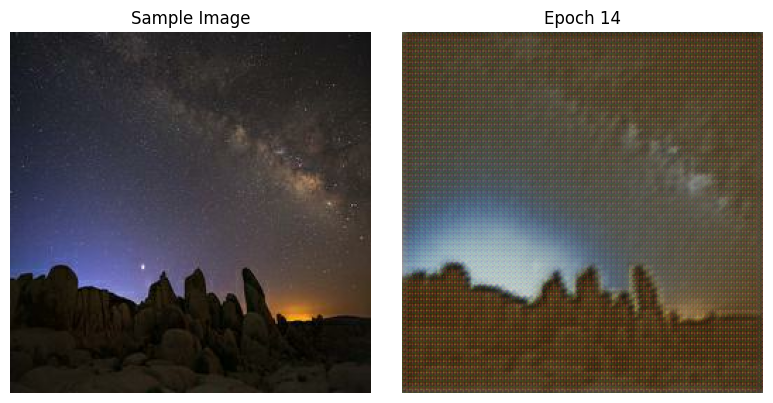

Starting epoch 15/20


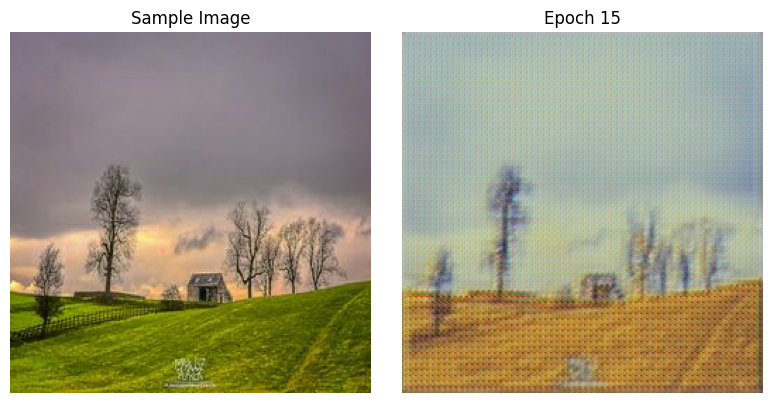

Starting epoch 16/20


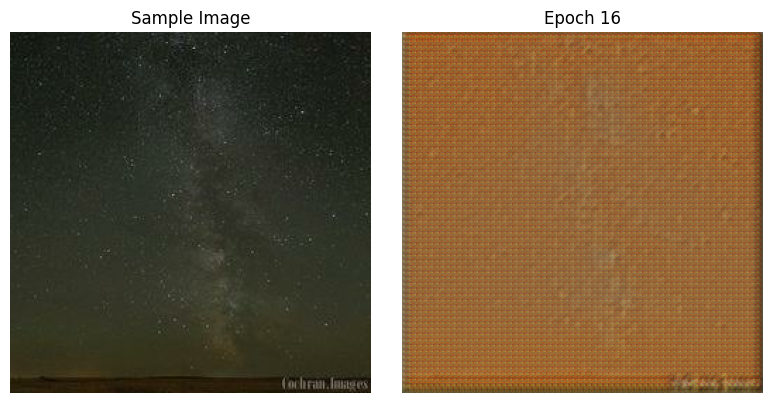

Starting epoch 17/20


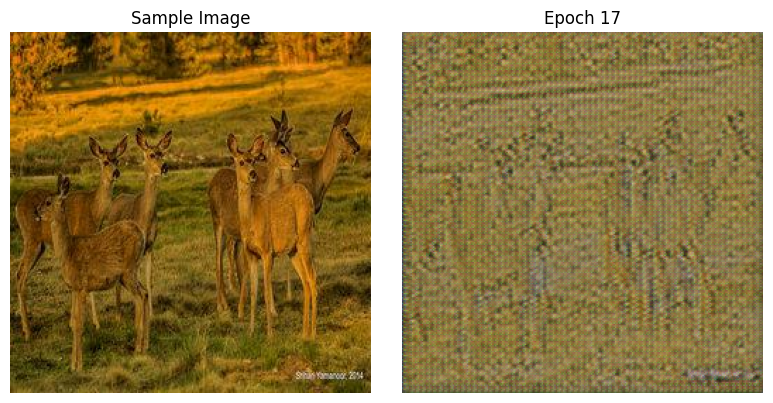

Starting epoch 18/20


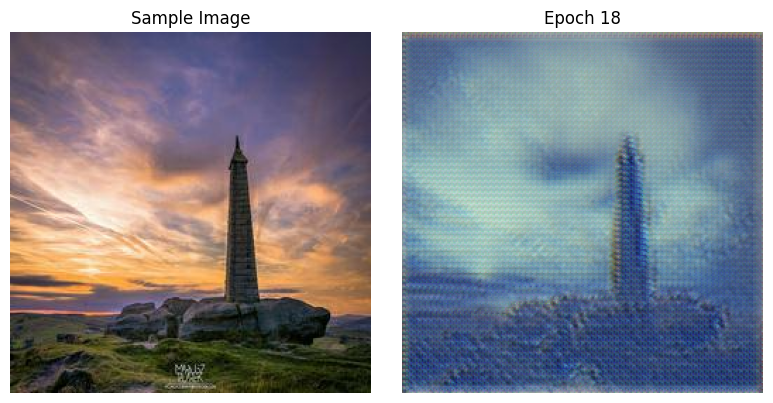

Starting epoch 19/20


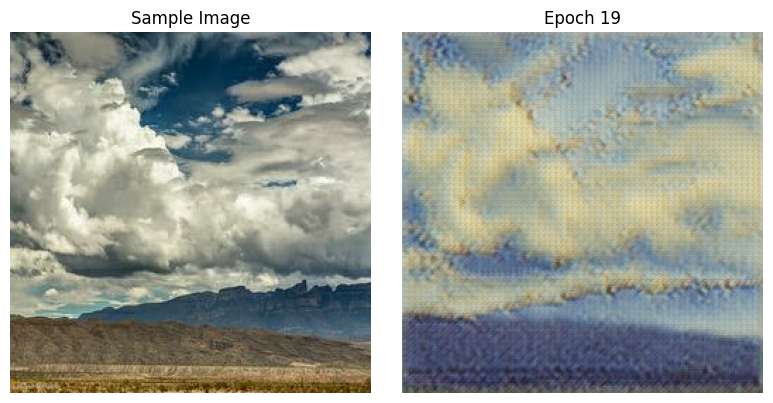

Starting epoch 20/20


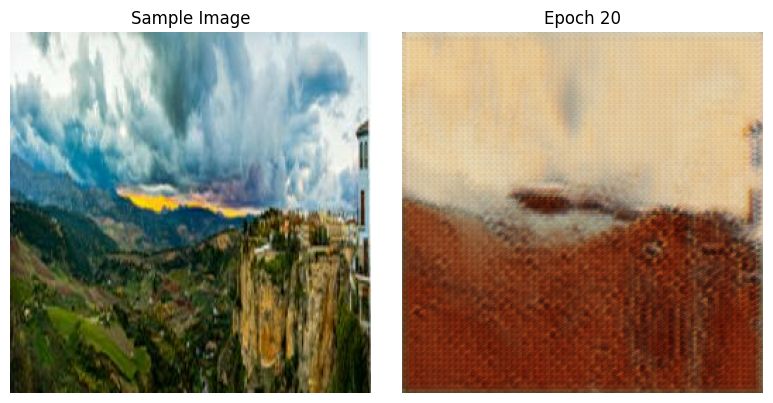

In [28]:

gen_losses = []
disc_losses = []
EPOCHS = 20

for epoch in range(EPOCHS):
    print(f'Starting epoch {epoch+1}/{EPOCHS}')
    for photo_batch, monet_batch in zip(photo_dataset, monet_dataset):
        with tf.GradientTape(persistent=True) as tape:
            fake_monet = generator(photo_batch, training=True)
            real_output = discriminator(monet_batch, training=True)
            fake_output = discriminator(fake_monet, training=True)
            gen_loss = generator_loss(fake_output)
            disc_loss = discriminator_loss(real_output, fake_output)

        gradients_of_generator = tape.gradient(gen_loss, generator.trainable_variables)
        gradients_of_discriminator = tape.gradient(disc_loss, discriminator.trainable_variables)

        gen_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
        disc_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    gen_losses.append(gen_loss.numpy())
    disc_losses.append(disc_loss.numpy())

    sample_photo = next(iter(photo_dataset))
    generated = generator(sample_photo)
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow((sample_photo[0] * 0.5 + 0.5))
    plt.title(f"Sample Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow((generated[0] * 0.5 + 0.5))
    plt.title(f"Epoch {epoch+1}")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


## 6. Loss Curves

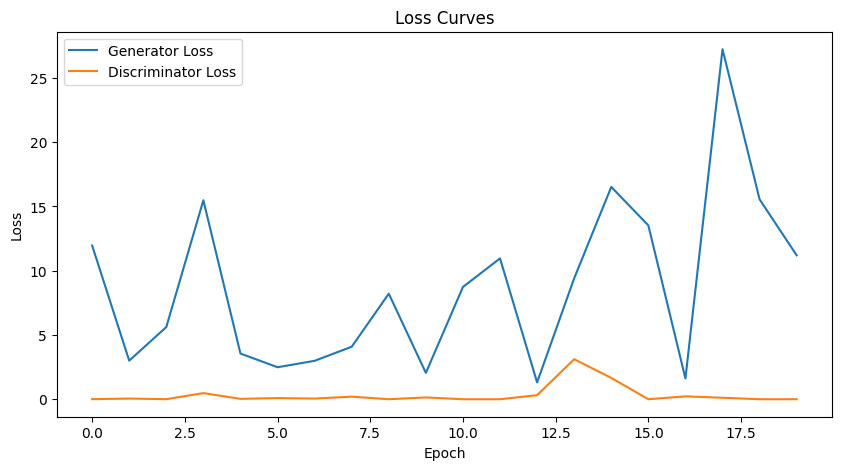

In [29]:

plt.figure(figsize=(10, 5))
plt.plot(gen_losses, label='Generator Loss')
plt.plot(disc_losses, label='Discriminator Loss')
plt.legend()
plt.title('Loss Curves')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()


The model seems to be pretty unstable and the loss varies quite a bit between epochs. Simple GAN is a relatively sensitive neural network model, and is heavily affected by tuning. 

## 7. Generate 7000 Monet-Style Images

In [30]:

photo_filenames = tf.data.Dataset.list_files(photo_dir + '/*.jpg')
photo_dataset_full = photo_filenames.map(load_and_preprocess).batch(1)

output_dir = '/kaggle/working/images'
os.makedirs(output_dir, exist_ok=True)

num_images = 7000
i = 1
for photo in tqdm(photo_dataset_full.take(num_images)):
    fake_monet = generator(photo, training=False)[0]
    fake_monet = (fake_monet + 1) * 127.5
    fake_monet = tf.cast(fake_monet, tf.uint8)
    img = tf.keras.preprocessing.image.array_to_img(fake_monet)
    filename = f"{i:05d}.jpg"
    img.save(os.path.join(output_dir, filename))
    i += 1


100%|██████████| 7000/7000 [01:23<00:00, 84.11it/s]


## 8. Zip images folder

In [32]:

shutil.make_archive('/kaggle/working/images', 'zip', '/kaggle/working/images')
print("Zipping completed! Submission ready.")


Zipping completed! Submission ready.


## 9. Final Conclusion
We successfully built and trained a GAN to generate Monet-style paintings from photographs.

Key learnings:
- GANs require careful hyperparameter tuning.
- Simple architectures can already create stylistic transfers.
- Longer training and CycleGAN architectures could yield even better results.

Future improvements:
- Implement full CycleGAN.
- Apply data augmentation.
- Train with larger datasets and for more epochs.